# Exploratory Data Analysis

# Import the data and call the data sheet

In [13]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import collections
from dash import Dash, dcc, html, Input, Output
import plotly.express as px
from sklearn.linear_model import LinearRegression
import category_encoders as ce
import plotly.express as px
import plotly.graph_objects as go
import scipy.stats as stats
from bioinfokit.analys import stat
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.graphics.factorplots import interaction_plot
import matplotlib.pyplot as plt

# Read the data

In [14]:
nyc_data = pd.read_excel('../data/nyc_data.xlsx').iloc[:,1:]
nyc_data_2 = pd.read_csv('../data/nyc_data_2.csv').iloc[:,1:]

Im going to split data yearly because we are only interested in 2020-2021 data since this is the most recent data. We would use the other years to figure out the trend. 

# Split the data frames yearly.¶

In [15]:
def split_data_year(data):
    df_16_17 = data[data['Year'] == '2016-17']
    df_17_18 = data[data['Year'] == '2017-18']
    df_18_19 = data[data['Year'] == '2018-19']
    df_19_20 = data[data['Year'] == '2019-20']
    df_20_21 = data[data['Year'] == '2020-21']
    return df_16_17, df_17_18, df_18_19, df_19_20, df_20_21

In [16]:
df_16_17, df_17_18, df_18_19, df_19_20, df_20_21 = split_data_year(nyc_data)

In [17]:
df2_16_17, df2_17_18, df2_18_19, df2_19_20, df2_20_21 = split_data_year(nyc_data_2)

We are mostly going to be using nyc_data_2. The reason is that this data is more summarized which makes it easy for me to feed it into tableau and code the charts.

# Correlation heat map

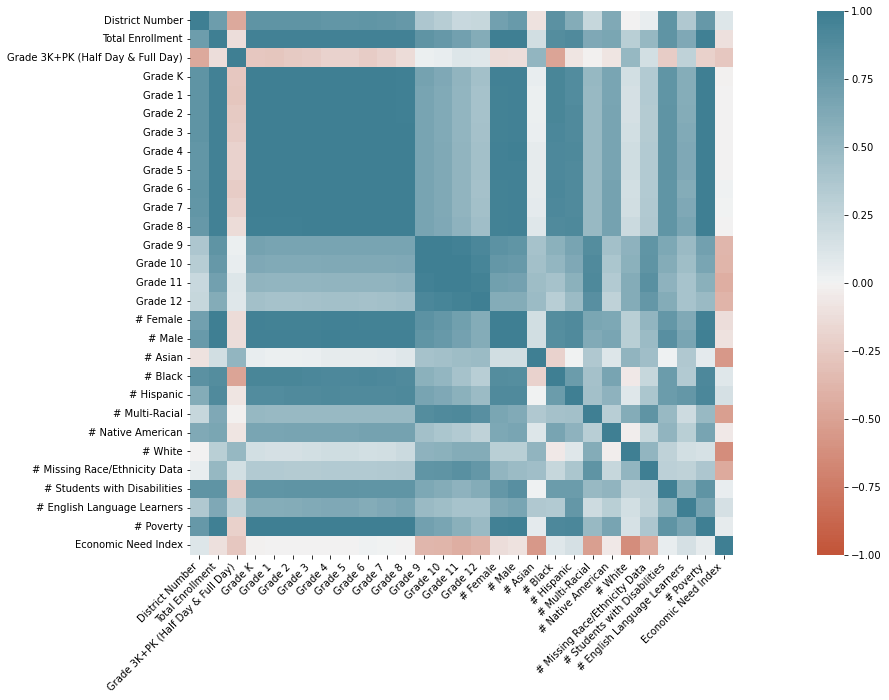

In [18]:
plt.figure(figsize = (30,10))
corr= nyc_data_2.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/heatmap.jpeg',bbox_inches='tight')


+1 - Complete positive correlation

+0.8 - Strong positive correlation

+0.6 - Moderate positive correlation

0 - no correlation whatsoever

-0.6 - Moderate negative correlation

-0.8 - Strong negative correlation

-1 - Complete negative correlation

In [19]:
def scatterplots(columns, ncol=None, figsize=(15, 8)):
    if ncol is None:
        ncol = len(columns)
    nrow = int(np.ceil(len(columns) / ncol))
    fig, axes = plt.subplots(nrow, ncol, figsize=figsize, squeeze=False)
    fig.subplots_adjust(wspace=0.5, hspace=0.6)
    for i, col in enumerate(columns):
        ax = axes.flatten()[i]
        ax.scatter(x = col, y = 'Economic Need Index', data=nyc_data_2, alpha=0.5)
        ax.set(xlabel=col, ylabel='Economic Need Index')
    nsubplots = nrow * ncol
    for empty in range(i+1, nsubplots):
        axes.flatten()[empty].set_visible(False)

In [20]:
features = [f for f in nyc_data_2.columns]

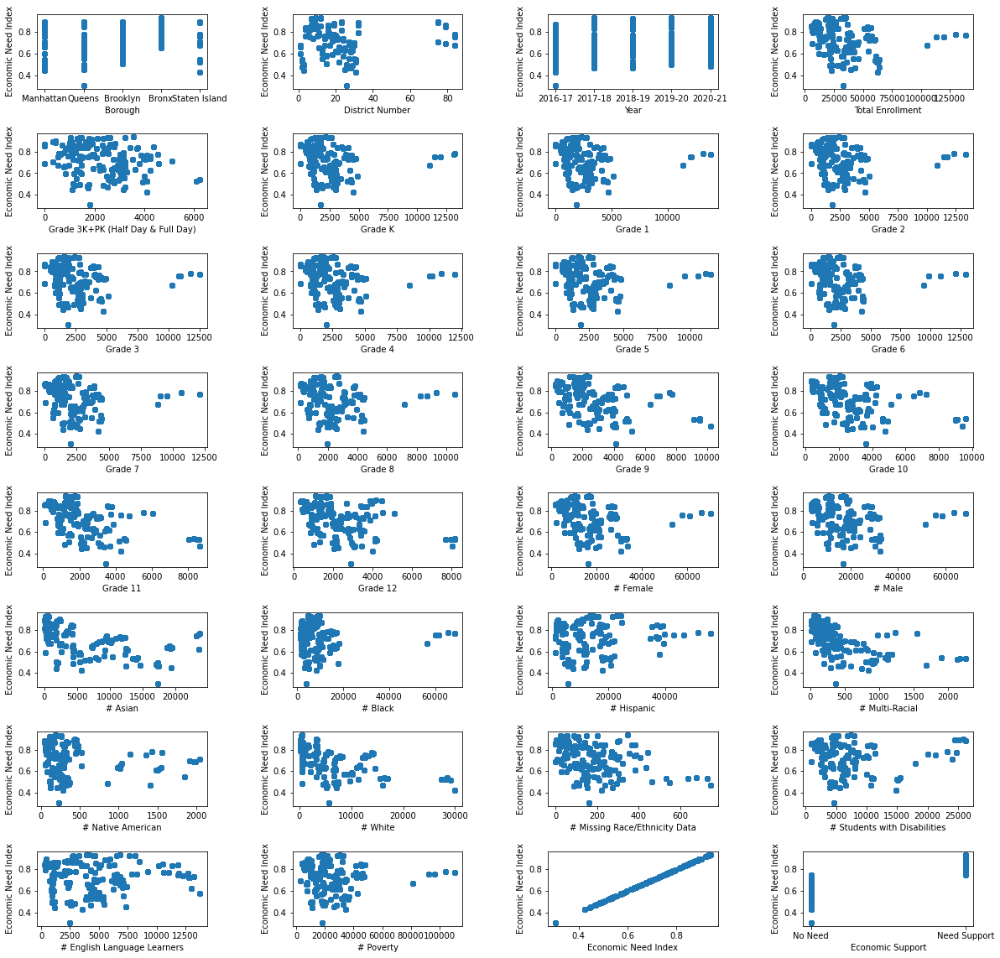

In [21]:
scatterplots(features, ncol=4, figsize=(20, 20))
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/scatter_all.jpeg',bbox_inches='tight')


# Target feature: Economic Need Index 

## Positive Correlation: 

• None

## Negative Correlation:
    
• White

• Missing data

• Asian

• Multi Racial

• Grade 3k+PK & Grade 9 ~ 12

# Borough Analysis

• Which borough needs the most economic support in 2020 ~ 2021? 

In [22]:
need_support_df = nyc_data[nyc_data['Economic Support']=='Need Support']

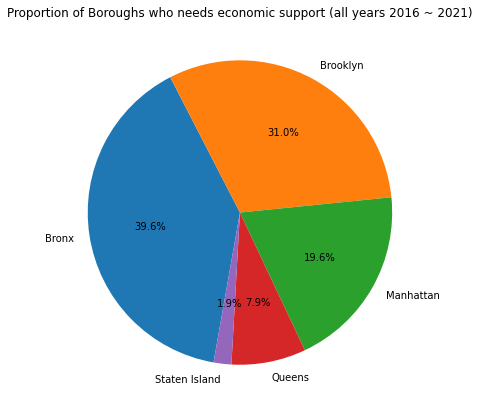

<Figure size 432x288 with 0 Axes>

In [23]:
plt.figure(figsize=(7,7))
plt.pie((need_support_df.Borough.value_counts()/ need_support_df.shape[0]).values, labels=(need_support_df.Borough.value_counts()/ need_support_df.shape[0]).index, autopct='%.1f%%', startangle=260, counterclock=False)
plt.title('Proportion of Boroughs who needs economic support (all years 2016 ~ 2021)')
plt.show()
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/piechart_all_years.jpeg',bbox_inches='tight')


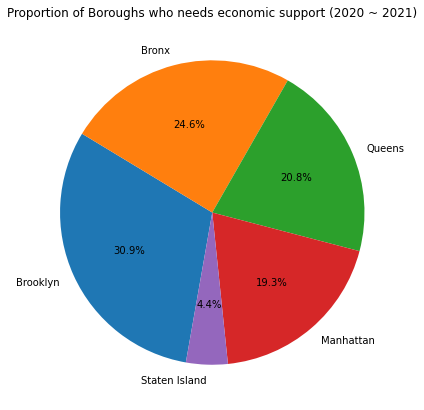

In [24]:
plt.figure(figsize=(7,7))
plt.pie((df_20_21.Borough.value_counts()/ df_20_21.shape[0]).values, labels=(df_20_21.Borough.value_counts()/ df_20_21.shape[0]).index, autopct='%.1f%%', startangle=260, counterclock=False)
plt.title('Proportion of Boroughs who needs economic support (2020 ~ 2021)')
plt.show()

Queens is the only Borough that economic support increased.

# Grade Analysis

## We have some questions that needs to be answered:
    
    1. Previously from the data wrangling step, we identified that starting from grade 9, the count of students decrease. Is this true? As students reahc towards grade 12, does their economic need index increase or decrease


2. In the most recent year 2020-2021, whatd the top 3 grade that needs economic support. 

In [25]:
# Create df for grade
grade_df = nyc_data_2.loc[:,:'Grade 12']

#Concat with economic index
grade_df = pd.concat([grade_df,nyc_data[['Economic Need Index','Economic Support']]], axis=1)
grade_df_columns = grade_df.columns

melt the grade columns¶

In [26]:
column_name_grades = grade_df.loc[:,'Grade 3K+PK (Half Day & Full Day)': 'Grade 12'].columns
melt_grade_df = pd.melt(grade_df, id_vars = ['Borough','Year'], var_name='Grade', value_vars = column_name_grades, value_name = 'student')
melt_grade_df_with_economic_index = pd.concat([melt_grade_df,nyc_data_2[['Economic Support','Economic Need Index']]],axis=1)

In [27]:
temporary_df = melt_grade_df[melt_grade_df['Year'] == '2020-21']

We should have done this step in data wrangling. However for simplicity, it is done during the EDA process

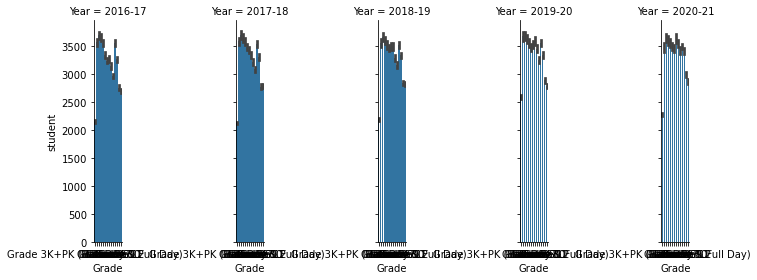

<Figure size 6400x3200 with 0 Axes>

In [28]:
plot = sns.FacetGrid(melt_grade_df, col="Year", height=4, aspect=.5)
figure(figsize=(80,40), dpi = 80)
plot.map(sns.barplot, "Grade", "student", order= ['Grade 3K+PK (Half Day & Full Day)', 'Grade K', 'Grade 1',
       'Grade 2', 'Grade 3', 'Grade 4', 'Grade 5', 'Grade 6', 'Grade 7',
       'Grade 8', 'Grade 9', 'Grade 10', 'Grade 11', 'Grade 12'])
plt.show()

I can see the that once it reaches 8~9 grade, the amount of enrollment decreases and it happened every year since 2016.

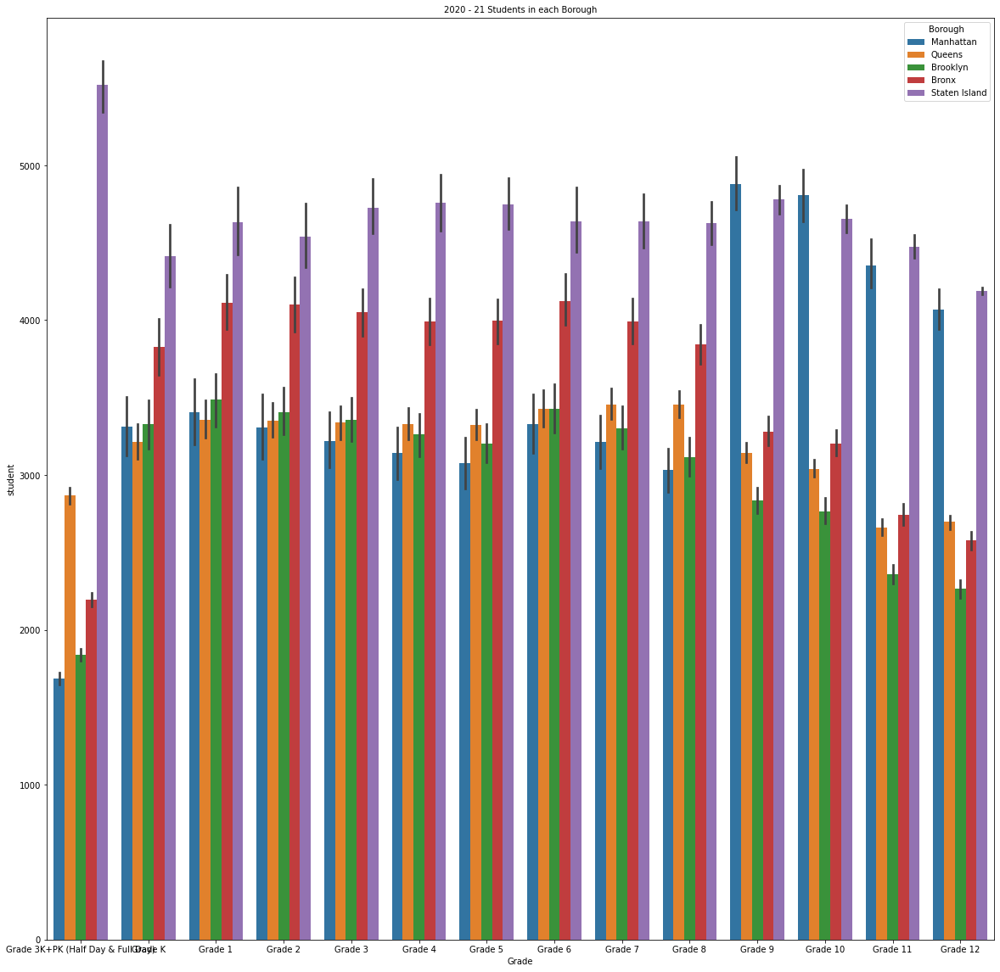

In [29]:
figure(figsize=(20,20))
sns.barplot(data=temporary_df, x="Grade", y="student", hue="Borough")
plt.title('2020 - 21 Students in each Borough', fontsize = 10)
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/barchart_grades_borough.jpeg',bbox_inches='tight')


Every borough has decreasing trend of students from grade 9.

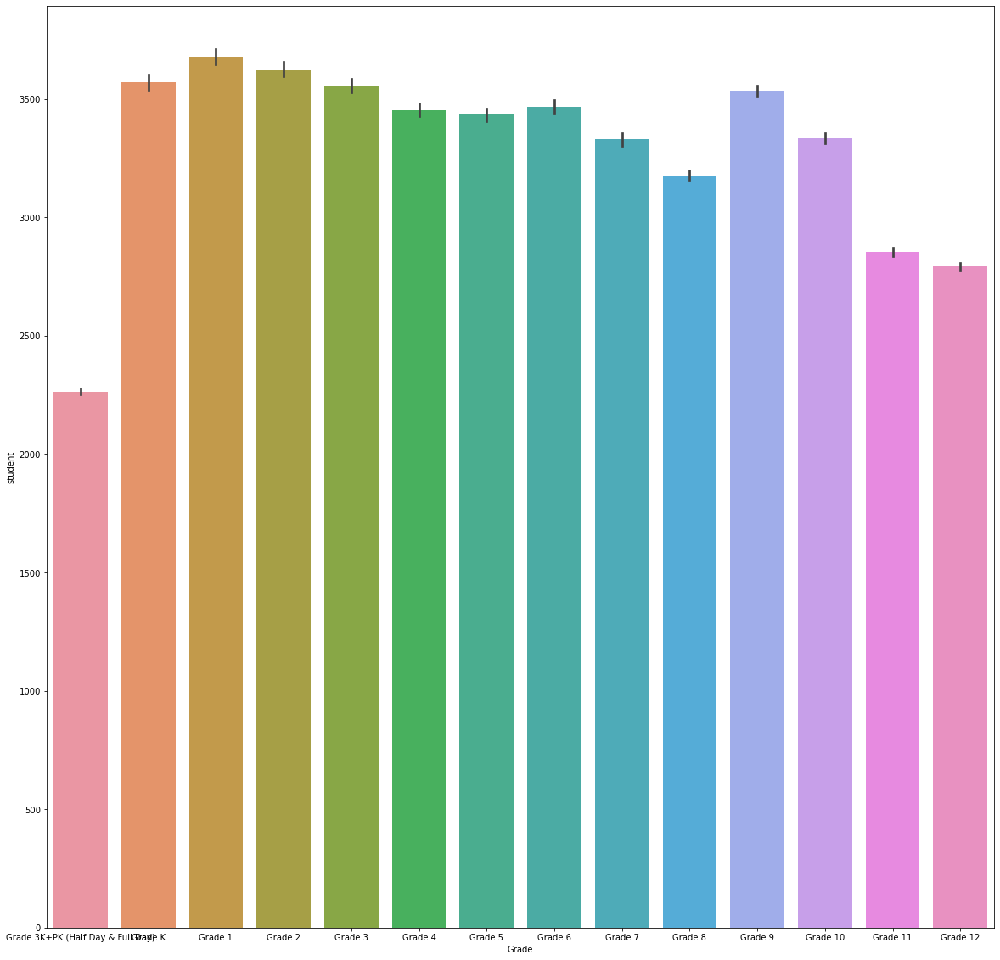

In [30]:
figure(figsize=(20,20))
sns.barplot(x = 'Grade', y = 'student',data = melt_grade_df)
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/barchart_grades_w_borough.jpeg',bbox_inches='tight')


We can confirm that grade 11~12 starts to decrease. Students in Grade 8 is less than other grades as well. 8th grade is the age to graduate middle school so we can make assumptions that some students does not decide to go to high school because of their financial situations. 

# From this Chart, we can conclude with the following:

Until grade 8, the student number maintains relatively same.

Number of students decrease from grade 10 to grade 12 for all the boroughs.

Brooklyn and Bronx has a lot of students with economic needs.

## We can assume students drop out due to their financial disadvantage.

# Sex Analysis

Melting the sex column

In [31]:
#Create a sex column
column_name_grades = nyc_data_2.loc[:,['# Female','# Male']].columns
df2 = nyc_data_2.drop(column_name_grades ,axis= 1)
column_names_w_grade = df2.columns
melt_sex_df = pd.melt(nyc_data_2, id_vars = column_names_w_grade, var_name='Sex', value_vars = column_name_grades, value_name = 'amount')
melt_sex_df.head()

,Borough,District Number,Year,Total Enrollment,Grade 3K+PK (Half Day & Full Day),Grade K,Grade 1,Grade 2,Grade 3,Grade 4,...,# Native American,# White,# Missing Race/Ethnicity Data,# Students with Disabilities,# English Language Learners,# Poverty,Economic Need Index,Economic Support,Sex,amount
0,Manhattan,1,2016-17,11772,827,850,907,889,859,834,...,74,2059,27,2555,1065,7265,0.597,No Need,# Female,5748
1,Manhattan,1,2017-18,11632,800,851,846,854,862,839,...,71,2022,29,2528,1016,7682,0.670,No Need,# Female,5590
2,Manhattan,1,2018-19,11376,759,799,850,816,838,839,...,60,2045,38,2597,966,7314,0.661,No Need,# Female,5457
3,Manhattan,1,2019-20,11506,960,812,782,848,813,818,...,63,2056,126,2593,919,7419,0.677,No Need,# Female,5517
4,Manhattan,1,2020-21,11021,832,728,762,746,787,775,...,57,1992,101,2455,915,6960,0.663,No Need,# Female,5278


# We can answer the following questions from the dataframe. 

Which sex needs more economic support yearly? 

Top 5 schools that need economic support.

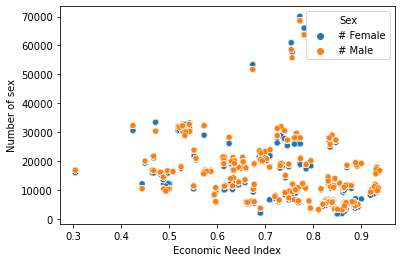

In [32]:
sns.scatterplot(x = 'Economic Need Index', y = 'amount', hue = 'Sex', data = melt_sex_df)
plt.ylabel('Number of sex')
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/scatter_sex.jpeg',bbox_inches='tight')


Seems like more males are in economic need.

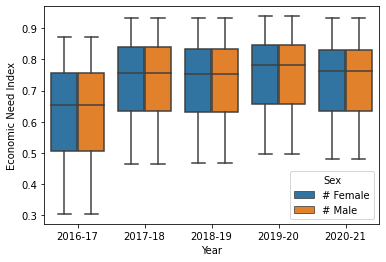

In [33]:
sns.boxplot(x = 'Year', y = 'Economic Need Index', hue = 'Sex', data = melt_sex_df)
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/sex_box.jpeg',bbox_inches='tight')


It's good that there is a slight decrease in economic need index for both sex

In [34]:
fig = px.histogram(melt_sex_df, x = 'Sex', y = 'amount',color = 'Sex', pattern_shape = 'Economic Support')
fig.show()

Let's see the Sex ratio for schools that has the highest economic need index.

# Relationship between Poverty and Economic Need Index column

In [35]:
my_rho = np.corrcoef(nyc_data['Economic Need Index'], nyc_data['# Poverty'])

print("Correlation:", my_rho[0][1])

Correlation: 0.09579919857621642


In [36]:
fig = px.scatter(nyc_data_2, x="Economic Need Index", y="# Poverty", trendline="ols")
fig.show()
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/povert_corr.jpeg',bbox_inches='tight')


<Figure size 432x288 with 0 Axes>

# Student with disability

Some schools has a lot of students with disability. 

Does having a lot of students in schools correlate to requiring economic support?

which borough has the most students with disability?

Let's see the correlation first.

In [37]:
my_rho = np.corrcoef(nyc_data['Economic Need Index'], nyc_data['# Students with Disabilities'])

print(my_rho)

[[1.         0.02510495]
 [0.02510495 1.        ]]


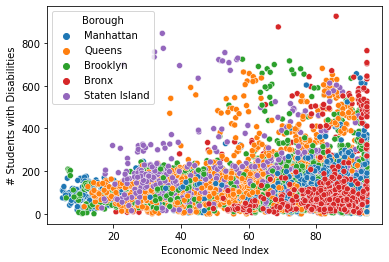

In [38]:
sns.scatterplot(data=nyc_data, x="Economic Need Index", y="# Students with Disabilities", hue="Borough")
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/scatter_disability.jpeg',bbox_inches='tight')


In bronx, a lot of schools have around roughly 15% students with disabilities with high economid need index. 
Queens has a lot of students in lower mid economic need index.
Brooklyn and Manhattan is very dispersed. 
Staten Island has mostly low economic need index.

# English Language Learners

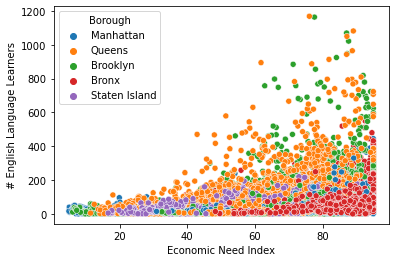

In [39]:
sns.scatterplot(data=nyc_data, x="Economic Need Index", y="# English Language Learners", hue="Borough")

plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/eng_learners_scatter.jpeg',bbox_inches='tight')


It is easy to visualize queens has the most english learners with high economic need index. 

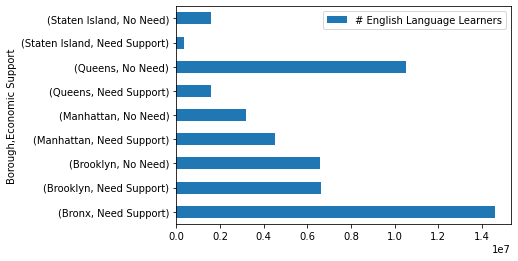

In [40]:
df2_20_21.groupby(['Borough','Economic Support'])['# English Language Learners'].sum().plot(kind='barh', legend=True)

plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/needs_support_borough.jpeg',bbox_inches='tight')


# Race Analysis

# Race 

• Hispanic

• Black

• White

• Asian

• Native American

• Multi Racial

• Missing 

In [41]:
race_df = nyc_data.iloc[:,19:26]
temp_df = nyc_data.loc[:,['School Name','Year','Total Enrollment','Economic Need Index','Borough','District Number','School Number']]
final_df = pd.concat([race_df,temp_df],axis=1)
final_df.head()

,# Asian,# Black,# Hispanic,# Multi-Racial,# Native American,# White,# Missing Race/Ethnicity Data,School Name,Year,Total Enrollment,Economic Need Index,Borough,District Number,School Number
0,14,51,105,3,1,4,0,P.S. 015 Roberto Clemente,2016-17,178,88.2,Manhattan,1,15
1,20,52,110,1,1,6,0,P.S. 015 Roberto Clemente,2017-18,190,89.0,Manhattan,1,15
2,24,48,95,0,1,6,0,P.S. 015 Roberto Clemente,2018-19,174,88.8,Manhattan,1,15
3,27,56,96,0,2,9,0,P.S. 015 Roberto Clemente,2019-20,190,86.7,Manhattan,1,15
4,26,53,102,1,0,11,0,P.S. 015 Roberto Clemente,2020-21,193,85.6,Manhattan,1,15


melt the data and gather all the race in one column!

In [42]:
melt_race_df = pd.melt(final_df, id_vars = final_df.iloc[:,7:], value_vars = final_df.iloc[:,:7], value_name = 'value', var_name = 'race')

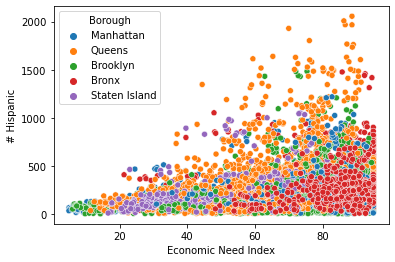

In [43]:
sns.scatterplot(data=nyc_data, x="Economic Need Index", y="# Hispanic", hue="Borough")
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/scatter_hispanic.jpeg',bbox_inches='tight')


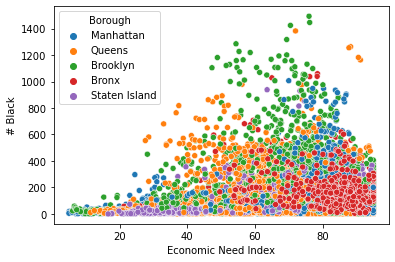

In [44]:
sns.scatterplot(data=nyc_data, x="Economic Need Index", y="# Black", hue="Borough")
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/scatter_black.jpeg',bbox_inches='tight')


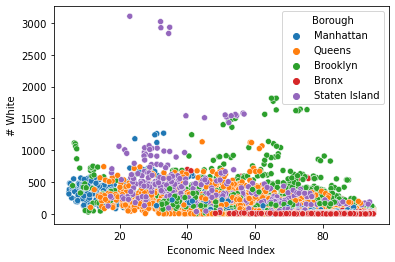

In [45]:
sns.scatterplot(data=nyc_data, x="Economic Need Index", y="# White", hue="Borough")
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/scatter_white.jpeg',bbox_inches='tight')


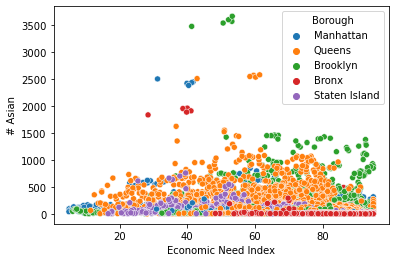

In [46]:
sns.scatterplot(data=nyc_data, x="Economic Need Index", y="# Asian", hue="Borough")
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/scatter_asian.jpeg',bbox_inches='tight')


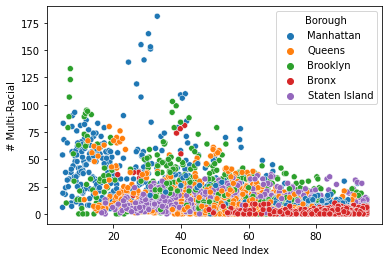

In [47]:
sns.scatterplot(data=nyc_data, x="Economic Need Index", y="# Multi-Racial", hue="Borough")
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/scatter_multiracial.jpeg',bbox_inches='tight')


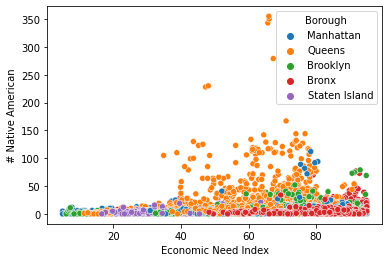

In [48]:
sns.scatterplot(data=nyc_data, x="Economic Need Index", y="# Native American", hue="Borough")
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/scatter_native.jpeg',bbox_inches='tight')


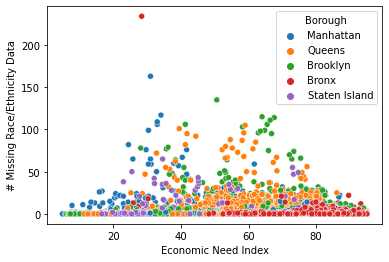

In [49]:
sns.scatterplot(data=nyc_data, x="Economic Need Index", y="# Missing Race/Ethnicity Data", hue="Borough")
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/scatter_missing.jpeg',bbox_inches='tight')


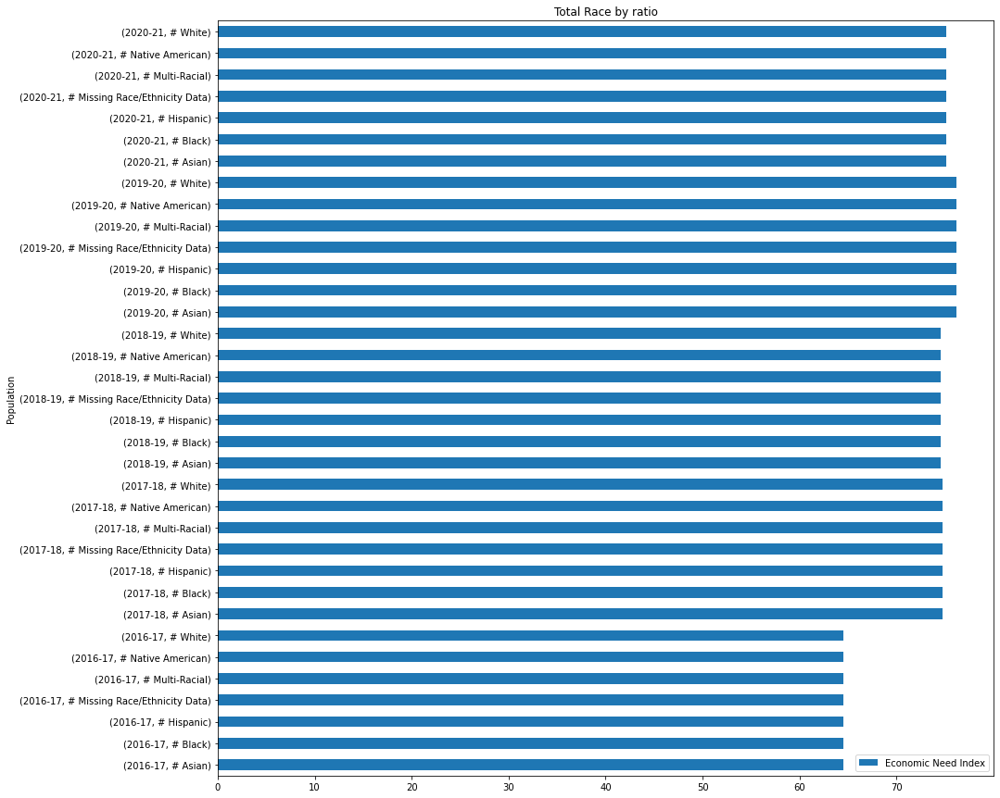

In [50]:
melt_race_df.groupby(['Year','race'])[['Economic Need Index']].mean().plot(kind='barh', title='Total Race by ratio',
               ylabel='Year', xlabel='Population', figsize = (15,15))
plt.xticks(rotation=0)
plt.show()

• Bronx and Brooklyn are full of people who needs economic support. 

• Out of the people who need economical support, majority are hispanic and black people. 

• The economic need index decreased on 2021 compared to 2020 so 2022 might have even lower economic need index. 

# School 

My question to answer is which school has the worst economic need index score(highest)? And how is their grade and race ratio.

## Demographics of Schools with Max Economic Need Index which is 95.

In [51]:
df_20_21[['Economic Need Index']].max()

Economic Need Index    95.0
dtype: float64

The maximum Economic Need Index is 95. Let's filter out the schools that has 95 economic need index.

In [52]:
df_20_21[df_20_21['Economic Need Index'] == 95]['Borough'].value_counts()

Bronx            87
Manhattan        16
Brooklyn         14
Queens            5
Staten Island     1
Name: Borough, dtype: int64

Text(0.5, 1.0, 'economic need index that is 95')

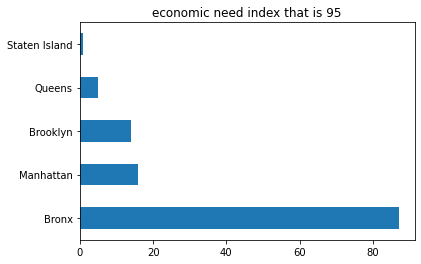

In [53]:
df_20_21[df_20_21['Economic Need Index'] == 95]['Borough'].value_counts().plot(kind = 'barh')
plt.title('economic need index that is 95')

So bronx has 87 schools which are way more than other schools. Let's dive deeper.

In [54]:
econ_95 = df_20_21[df_20_21['Economic Need Index'] == 95]
econ_95 = econ_95[['District Number','Borough','School Name','Total Enrollment','# Poverty']]
econ_95['Poverty_percentage'] = econ_95['# Poverty']/econ_95['Total Enrollment'] * 100
econ_95['Poverty_percentage'].max()

95.0

There are schools which 95% of the people are in poverty. This means out of 100 people, 95 people needs economical support

In [55]:
econ_95[econ_95['Poverty_percentage']== 95]['Borough'].value_counts()

Bronx        53
Manhattan     9
Brooklyn      7
Queens        3
Name: Borough, dtype: int64

<AxesSubplot:>

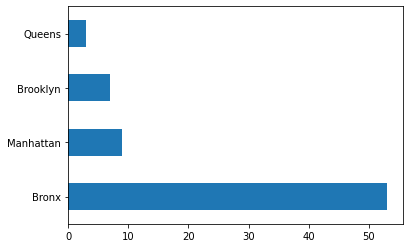

In [56]:
econ_95[econ_95['Poverty_percentage']== 95]['Borough'].value_counts().plot(kind='barh')

Bronx has the most highest school with economical index with 95. In addition, Staten island is not in the options anymore telling us there's no max value economic need index in this borough

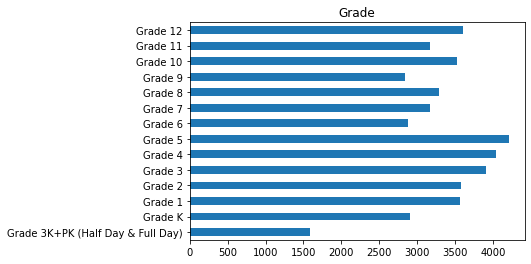

In [57]:
df_20_21[df_20_21['Economic Need Index'] == 95].loc[:,'Grade 3K+PK (Half Day & Full Day)':'Grade 12'].sum(axis=0).plot(kind='barh')
plt.title('Grade')
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/high_econ_sex.jpeg',bbox_inches='tight')


I see that starting from middle school which is 6th grade, there are a lot less students than before.

In [58]:
print("Schools with max Economc need index:", df_20_21[df_20_21['Economic Need Index'] == 95]['School Name'].nunique())

Schools with max Economc need index: 123


Text(0.5, 1.0, 'Race')

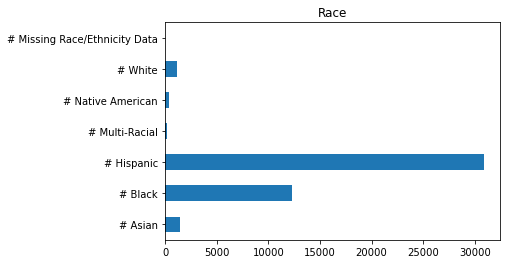

In [59]:
df_20_21[df_20_21['Economic Need Index'] == 95].loc[:,'# Asian':'# Missing Race/Ethnicity Data'].sum(axis=0).plot(kind='barh')
plt.title('Race')

I want to know the percentage

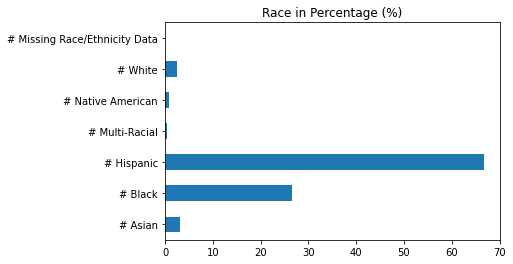

In [60]:
(df_20_21[df_20_21['Economic Need Index'] == 95].loc[:,'# Asian':'# Missing Race/Ethnicity Data'].sum(axis=0) * 100/(df_20_21[df_20_21['Economic Need Index'] == 95]['Total Enrollment'].sum(axis=0))).plot(kind='barh')
plt.title('Race in Percentage (%)')
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/high_econ_race.jpeg',bbox_inches='tight')


Mostly Hispanic people 

<AxesSubplot:>

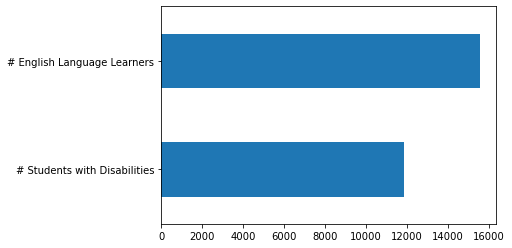

In [61]:
df_20_21[df_20_21['Economic Need Index'] == 95].loc[:,['# Students with Disabilities', '# English Language Learners']].sum(axis=0).plot(kind='barh')

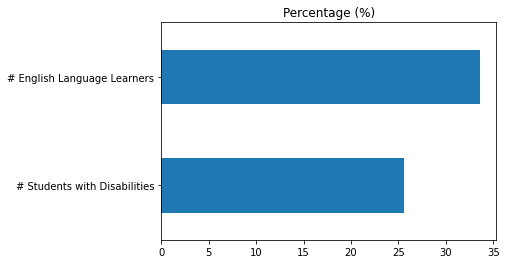

In [62]:
(df_20_21[df_20_21['Economic Need Index'] == 95].loc[:,['# Students with Disabilities', '# English Language Learners']].sum(axis=0) * 100/(df_20_21[df_20_21['Economic Need Index'] == 95]['Total Enrollment'].sum(axis=0))).plot(kind='barh')
plt.title('Percentage (%)')
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/high_econ_learners.jpeg',bbox_inches='tight')


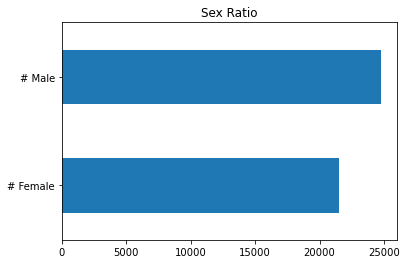

In [63]:
df_20_21[df_20_21['Economic Need Index'] == 95].loc[:,'# Female':'# Male'].sum(axis=0).plot(kind='barh')
plt.title('Sex Ratio')
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/high_econ_sex.jpeg',bbox_inches='tight')


In [64]:
(df_20_21[df_20_21['Economic Need Index'] == 95].loc[:,'# Female':'# Male'].sum(axis=0)*100) / (df_20_21[df_20_21['Economic Need Index'] == 95]['Total Enrollment'].sum(axis=0))

# Female    46.53108
# Male      53.46892
dtype: float64

In [65]:
print("There are 7% more males!")

There are 7% more males!


## Demographics of Schools with very low Economic Need Index

In [66]:
df_20_21['Economic Need Index'].min()

6.7

6.7 is the minimum index value. Let's filter the data for less than 10.

In [67]:
df_20_21[df_20_21['Economic Need Index'] < 10].columns

Index(['School Name', 'Year', 'Total Enrollment',
       'Grade 3K+PK (Half Day & Full Day)', 'Grade K', 'Grade 1', 'Grade 2',
       'Grade 3', 'Grade 4', 'Grade 5', 'Grade 6', 'Grade 7', 'Grade 8',
       'Grade 9', 'Grade 10', 'Grade 11', 'Grade 12', '# Female', '# Male',
       '# Asian', '# Black', '# Hispanic', '# Multi-Racial',
       '# Native American', '# White', '# Missing Race/Ethnicity Data',
       '# Students with Disabilities', '# English Language Learners',
       '# Poverty', 'Economic Need Index', 'Borough', 'District Number',
       'School Number', 'Economic Support'],
      dtype='object')

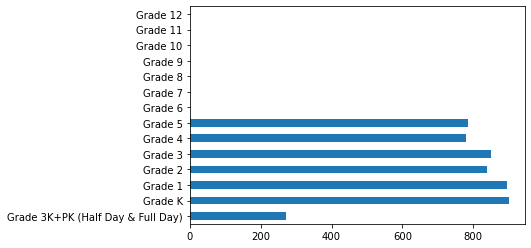

In [68]:
df_20_21[df_20_21['Economic Need Index'] < 10].loc[:,'Grade 3K+PK (Half Day & Full Day)': 'Grade 12'].sum(axis=0).plot(kind = 'barh')
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/low_econ_grade.jpeg',bbox_inches='tight')


This is really interesting. Elementary schools and Pre schools has the least economic need index. 

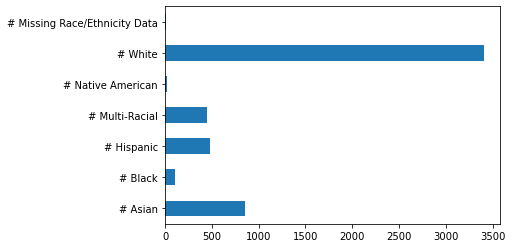

In [69]:
df_20_21[df_20_21['Economic Need Index'] < 10].loc[:,'# Asian': '# Missing Race/Ethnicity Data'].sum(axis=0).plot(kind = 'barh')
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/low_econ_race.jpeg',bbox_inches='tight')


Text(0.5, 1.0, 'Race in Percentage')

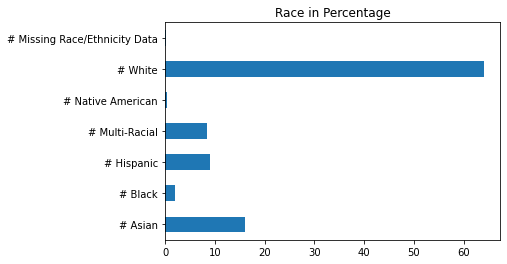

In [70]:
((df_20_21[df_20_21['Economic Need Index'] < 10].loc[:,'# Asian': '# Missing Race/Ethnicity Data'].sum(axis=0)*100) / (df_20_21[df_20_21['Economic Need Index'] < 10]['Total Enrollment'].sum(axis=0))).plot(kind = 'barh')
plt.title('Race in Percentage')

White are the majority. 

In [71]:
print("Poverty rate: {}%".format(df_20_21[df_20_21['Economic Need Index'] < 10]['# Poverty'].sum(axis=0) / df_20_21[df_20_21['Economic Need Index'] < 10]['Total Enrollment'].sum(axis=0) * 100))

Poverty rate: 8.266177852979883%


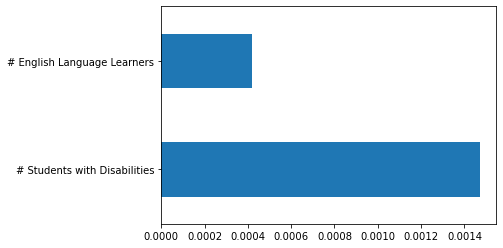

In [72]:
((df_20_21[df_20_21['Economic Need Index'] < 10].loc[:,['# Students with Disabilities','# English Language Learners']].sum(axis=0)) / (df_20_21[df_20_21['Economic Need Index'] < 10]['Total Enrollment'].sum(axis=0) * 100)).plot(kind='barh')
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/low_econ_bar.jpeg',bbox_inches='tight')



Not a lot of students have disabilities or english learners.

# ANOVA Test

I chose 3 columns to include in my ANOVA Test. The ANOVA test is designed to see if there is a statistical difference between each groups. I performed a two tailed ANOVA Test because I have two factors meaning two independent variables (Year and Borough).

Here, using two-way ANOVA, we can simultaneously evaluate how different boroughs and years affects the economic need index.

If I performed one tail ANOVA, I can only recieve results for one factor at a time. 

In [73]:
data_ANOVA = nyc_data[['Year','Borough','Economic Need Index']]

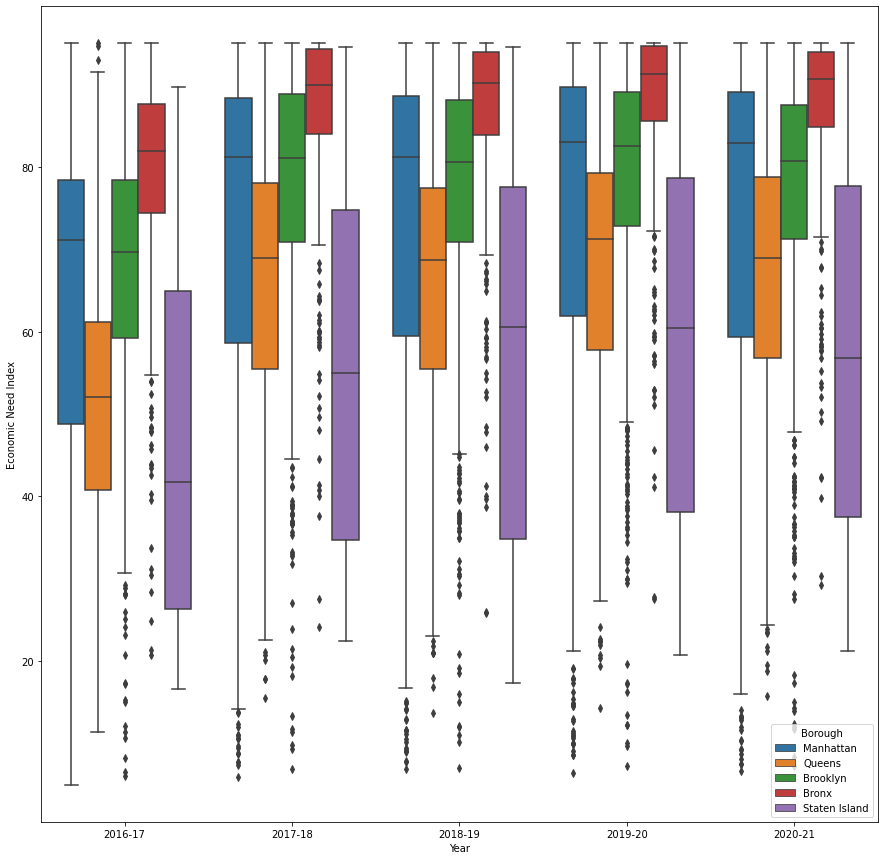

In [74]:
plt.figure(figsize=(15,15))
sns.boxplot(data = data_ANOVA, x = 'Year', y = 'Economic Need Index', hue = 'Borough')
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/boxplot_econ_ANOVA.jpeg',bbox_inches='tight')


From two-way ANOVA, we can tests three hypotheses 1) effect of genotype on yield 2) effect of time (years) on yield, and 3) effect of genotype and time (years) interactions on yield

In [75]:
data_ANOVA.Borough.value_counts()

Brooklyn         2832
Bronx            2217
Queens           1925
Manhattan        1788
Staten Island     407
Name: Borough, dtype: int64

In [76]:
data_ANOVA = data_ANOVA.rename(columns = {'Economic Need Index':'Value'})

We have unbalanced dataset so we are going to give the parameter type as type = 3

In [77]:
model = ols('Value ~ C(Borough) + C(Year) + C(Borough):C(Year)', data=data_ANOVA).fit()
anova_table = sm.stats.anova_lm(model, typ=3)
anova_table

,sum_sq,df,F,PR(>F)
Intercept,2.642969e+06,1.0,8388.833675,0.000000e+00
C(Borough),1.900613e+05,4.0,150.814530,3.957366e-125
C(Year),2.423987e+04,4.0,19.234446,9.031812e-16
C(Borough):C(Year),1.117344e+04,16.0,2.216545,3.476727e-03
Residual,2.880890e+06,9144.0,NaN,NaN


The p value obtained from ANOVA analysis for Borough, years, and Economic Need Index are statistically significant (p<0.05). We conclude that type of Borough significantly affects the Economic Need Index outcome, time (years) significantly affects the Economic Need Index outcome, and interaction of both Borough and time (years) significantly affects the yield outcome.

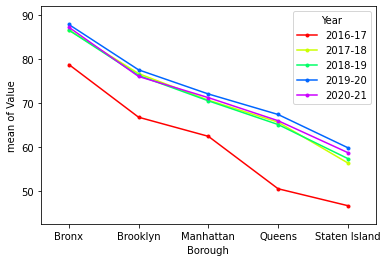

<Figure size 432x288 with 0 Axes>

In [78]:
fig = interaction_plot(x=data_ANOVA['Borough'], trace=data_ANOVA['Year'], response=data_ANOVA['Value'])

plt.show()

plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/interaction_plot.jpeg',bbox_inches='tight')


The lines from 2017 - 2021 have no interactions. The variable 2016-2017 has interactions

# Multiple pairwise comparisons (Post-hoc test)Permalink

Now, we know that Borough and time (years) differences are statistically significant, but ANOVA does not tell which Borough and time (years) are significantly different from each other. To know the pairs of significant different Borough and time (years), perform multiple pairwise comparison (Post-hoc comparison) analysis using Tukey’s HSD test.

In [79]:
res = stat()
# for main effect Genotype
res.tukey_hsd(df=data_ANOVA, res_var='Value', xfac_var='Borough', anova_model='Value~C(Borough)+C(Year)+C(Borough):C(Year)')
res.tukey_summary

/Users/taehyun/opt/anaconda3/lib/python3.9/site-packages/bioinfokit/analys.py:402: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,group1,group2,Diff,Lower,Upper,q-value,p-value
0,Manhattan,Queens,6.415641,4.825080,8.006203,15.563113,0.001
1,Manhattan,Brooklyn,5.296771,3.833996,6.759547,13.971414,0.001
2,Manhattan,Bronx,16.068960,14.529666,17.608255,40.278460,0.001
3,Manhattan,Staten Island,13.551568,10.891925,16.211212,19.659524,0.001
4,Queens,Brooklyn,11.712413,10.281900,13.142925,31.590865,0.001
5,Queens,Bronx,22.484602,20.975933,23.993271,57.504006,0.001
6,Queens,Staten Island,7.135927,4.493891,9.777963,10.421217,0.001
7,Brooklyn,Bronx,10.772189,9.398905,12.145473,30.265684,0.001
8,Brooklyn,Staten Island,18.848340,16.281205,21.415475,28.328997,0.001
9,Bronx,Staten Island,29.620529,27.009035,32.232022,43.763362,0.001


In [80]:
res.tukey_hsd(df=data_ANOVA, res_var='Value', xfac_var='Year', anova_model='Value ~ C(Borough) + C(Year) + C(Borough):C(Year)')
res.tukey_summary

/Users/taehyun/opt/anaconda3/lib/python3.9/site-packages/bioinfokit/analys.py:402: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,group1,group2,Diff,Lower,Upper,q-value,p-value
0,2016-17,2017-18,10.212200,8.597046,11.827355,24.395639,0.001000
1,2016-17,2018-19,10.015020,8.405352,11.624688,24.006137,0.001000
2,2016-17,2019-20,11.648419,10.044952,13.251886,28.029405,0.001000
3,2016-17,2020-21,10.568990,8.968873,12.169107,25.485229,0.001000
4,2017-18,2018-19,0.197181,-1.407974,1.802336,0.473973,0.900000
5,2017-18,2019-20,1.436218,-0.162717,3.035154,3.465742,0.102242
6,2017-18,2020-21,0.356789,-1.238788,1.952366,0.862782,0.900000
7,2018-19,2019-20,1.633399,0.040005,3.226793,3.955268,0.041343
8,2018-19,2020-21,0.553970,-1.036054,2.143993,1.344279,0.865879
9,2019-20,2020-21,1.079429,-0.504316,2.663174,2.629758,0.339677


In [81]:
res.tukey_hsd(df=data_ANOVA, res_var='Value', xfac_var=['Borough','Year'], anova_model='Value ~ C(Borough) + C(Year) + C(Borough):C(Year)')
res.tukey_summary.head()

/Users/taehyun/opt/anaconda3/lib/python3.9/site-packages/bioinfokit/analys.py:368: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,group1,group2,Diff,Lower,Upper,q-value,p-value
0,"(Manhattan, 2016-17)","(Manhattan, 2017-18)",8.210150,3.324710,13.095590,8.696403,0.001
1,"(Manhattan, 2016-17)","(Manhattan, 2018-19)",8.068544,3.189883,12.947205,8.558287,0.001
2,"(Manhattan, 2016-17)","(Manhattan, 2019-20)",9.623066,4.754451,14.491681,10.228227,0.001
3,"(Manhattan, 2016-17)","(Manhattan, 2020-21)",8.791131,3.925833,13.656430,9.350344,0.001
4,"(Manhattan, 2016-17)","(Queens, 2016-17)",11.917216,7.102875,16.731557,12.809443,0.001


Tukey's HSD test tells me the existance of statistical difference between each groups.

In [82]:
res = stat()
res.levene(df=data_ANOVA, res_var='Value', xfac_var=['Borough', 'Year'])
res.levene_summary

,Parameter,Value
0,Test statistics (W),33.913
1,Degrees of freedom (Df),24.000
2,p value,0.000


As the p value (0.09) is non-significant, we successfully reject the null hypothesis and conclude that treatments have unequal variances.

# Before we move on to preprocessing and modeling, 

## Let's modify the data into simpler terms and make sure we feed the model without any problem of curse of dimensionality.

In [83]:
nyc_data.loc[:,'Grade 1':'Grade 10'].sum(axis=1)

0       133
1       145
2       141
3       147
4       147
       ... 
9164    267
9165    264
9166    381
9167    472
9168    588
Length: 9169, dtype: int64

Reduce the grade columns to pre school, elementary school, middle school, high school

In [84]:
nyc_data['Pre School'] = nyc_data['Grade 3K+PK (Half Day & Full Day)'] + nyc_data['Grade K']
nyc_data['Elementary School'] = nyc_data.loc[:,'Grade 1':'Grade 5'].sum(axis=1)
nyc_data['Middle School'] = nyc_data.loc[:,'Grade 6':'Grade 8'].sum(axis=1)
nyc_data['High School'] = nyc_data.loc[:,'Grade 9':'Grade 12'].sum(axis=1)

drop grade k to grade 12.

In [85]:
nyc_data.drop(nyc_data.loc[:,'Grade 3K+PK (Half Day & Full Day)':'Grade 12'].columns, axis=1, inplace=True)

Also, drop the school name and school number because there's too many primary keys.

In [86]:
nyc_data.drop(['School Name','School Number','# Poverty','Total Enrollment'], axis=1, inplace=True)

Let's create the heatmap to check the correlation again and determine which column to drop.

<AxesSubplot:>

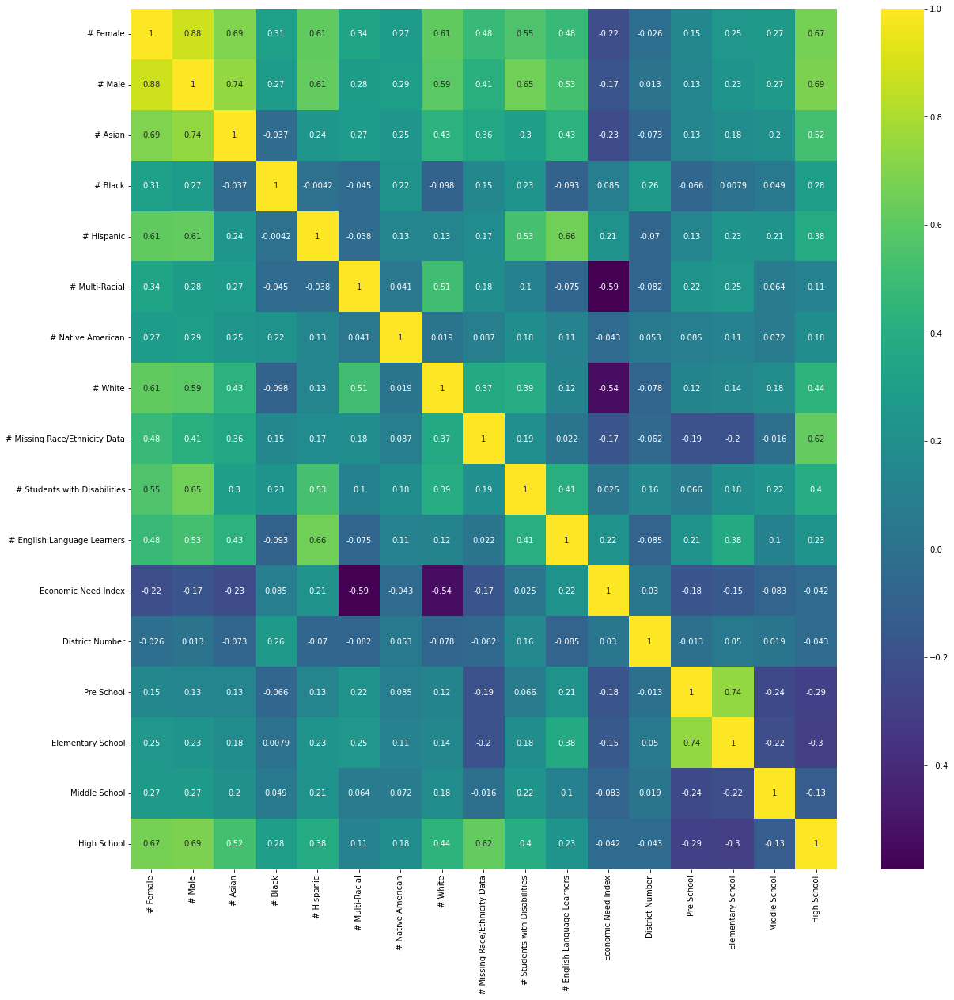

In [87]:
figure(figsize=(20,20))
sns.heatmap(nyc_data.corr(), annot=True, cmap='viridis')

Female and Male correlation is with each other. let's drop one. I'll drop female.

In [88]:
nyc_data.drop(['# Female'], axis=1, inplace=True)

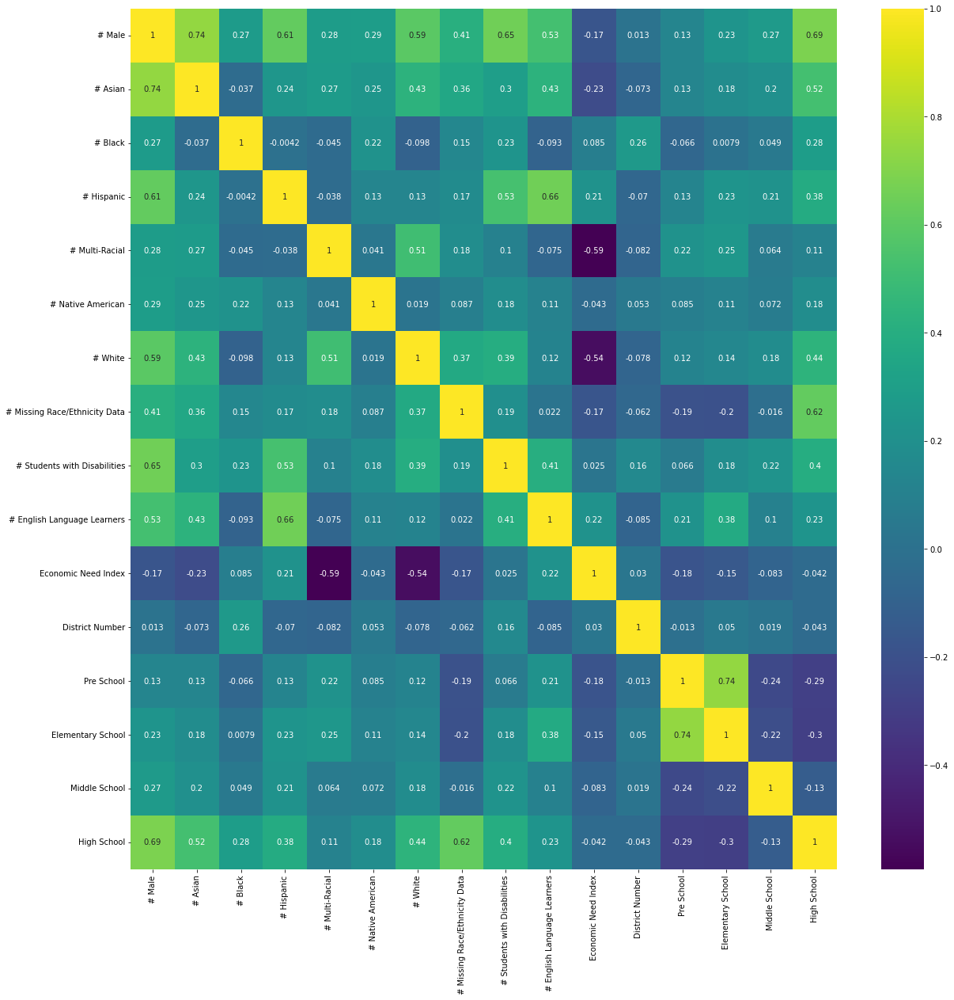

In [89]:
figure(figsize=(20,20))
sns.heatmap(nyc_data.corr(), annot=True, cmap='viridis')
plt.savefig('/users/taehyun/Dropbox/Springboard/NYC_Capstone_project/NewYorkCity_Education/image/After_feature_selection.jpeg',bbox_inches='tight')


This is enough for dropping columns and reduce the risk of multicolinearity. 

Having over 0.8 or less than -0.8 means high correlation which means there's no more highly correlated columns.

In [90]:
nyc_data_2 = nyc_data_2
nyc_data = nyc_data

In [91]:
nyc_data.head()

,Year,# Male,# Asian,# Black,# Hispanic,# Multi-Racial,# Native American,# White,# Missing Race/Ethnicity Data,# Students with Disabilities,# English Language Learners,Economic Need Index,Borough,District Number,Economic Support,Pre School,Elementary School,Middle School,High School
0,2016-17,95,14,51,105,3,1,4,0,51,12,88.2,Manhattan,1,Need Support,45,133,0,0
1,2017-18,91,20,52,110,1,1,6,0,49,8,89.0,Manhattan,1,Need Support,45,145,0,0
2,2018-19,89,24,48,95,0,1,6,0,39,8,88.8,Manhattan,1,Need Support,33,141,0,0
3,2019-20,96,27,56,96,0,2,9,0,46,17,86.7,Manhattan,1,Need Support,43,147,0,0
4,2020-21,92,26,53,102,1,0,11,0,43,21,85.6,Manhattan,1,Need Support,46,147,0,0


In [92]:
nyc_data.to_csv(r'../data/nyc_data_modeling.csv')

# Tableau

## Visualization Link: 

https://public.tableau.com/app/profile/taehyun.yoon/viz/NYCDATA_16676552294860/Dashboard1?publish=yes

### Borough

#### Students with Disabilities

Bronx and Brooklyn are the major boroughs that requires economic support. They also have high percentage of english learners and students with disabilities. 

The amount of students with disabilities and english learners arent correlated with economic index. 

All the boroughs have decreasing trend of poverty and economic need index except Brookyln and Staten Island.

Conclusion: We can say that we need to modify and enhance the system for students with disabilities in Bronx.

#### English Learners

Bronx had rougly 2 times more than all the boroughs in 2020-2021. 

Staten Island has the least. Out of 17,000 people, there are only 4,000 people who needs economic support

#### Race

Hispanic people are gathered up in Bronx,Queens, and Manhattan with over 100k people who needs economic support

A lot of asian people in Queens need economical support.

#### Grade

Throughout the whole year, 2020-2021, Grade #K+PK has the least enrollment

Grade 9 ~ 12 decreases constantly. It is a weird phenomenon. I predict it is because they dro pout of school and start considering something to do other than college